In [1]:
import Pkg
Pkg.activate(".")
Pkg.status()

  Activating project at `~/ascr_ad/compression_tests`


Status `~/ascr_ad/compression_tests/Project.toml`
  [336ed68f] CSV v0.10.15
  [523fee87] CodecBzip2 v0.8.5
  [5ba52731] CodecLz4 v0.4.5
  [ba30903b] CodecXz v0.7.4
  [944b1d66] CodecZlib v0.7.8
  [6b39b394] CodecZstd v0.8.6
  [a93c6f00] DataFrames v1.7.0
  [e55a990b] HeatEquation v0.1.0 `../julia_cuda/HeatEquation`
  [91a5bcdd] Plots v1.40.10
  [3bb67fe8] TranscodingStreams v0.11.3


In [2]:
import CSV
import DataFrames

In [3]:
using Plots
using Plots.PlotMeasures

# Random Matrix

In [4]:
df = CSV.read("results_compression_random_matrix.csv", DataFrames.DataFrame)
compressions = unique(df[:,:compression])
ndim = unique(df[:,:n])
nbytes = unique(df[:,:size])
sparsity = unique(df[:,:sparsity])
;

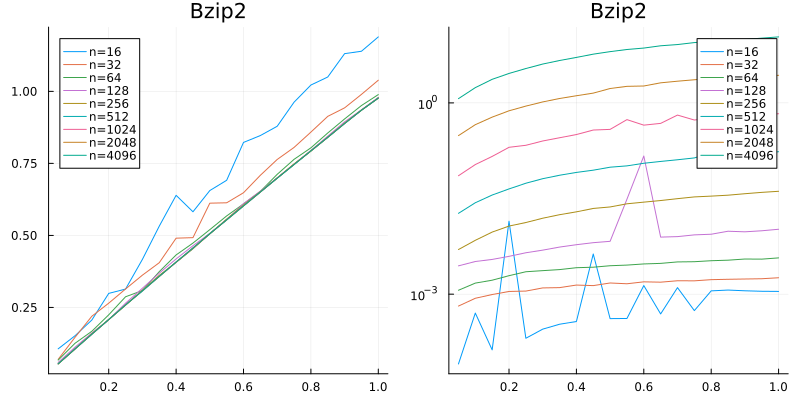

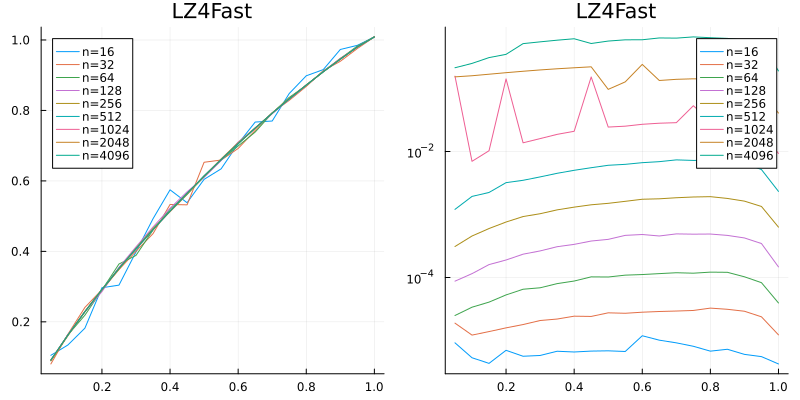

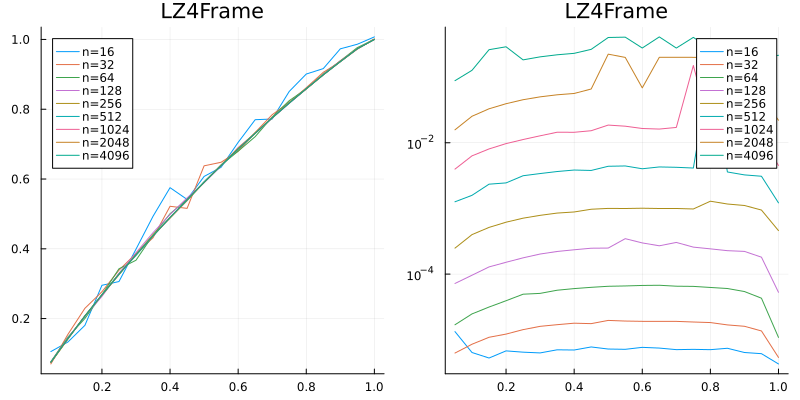

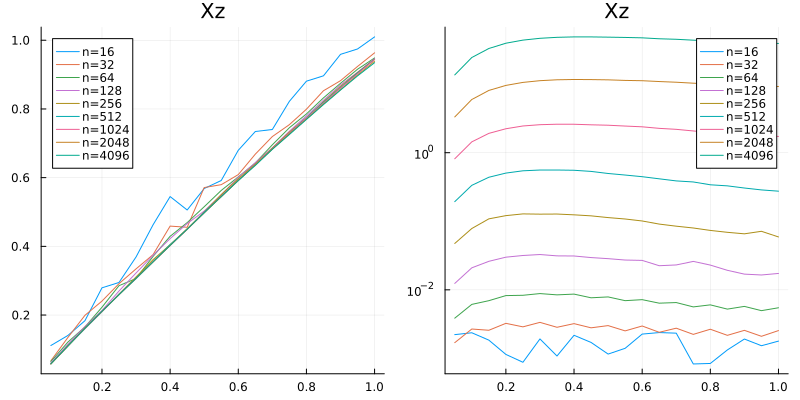

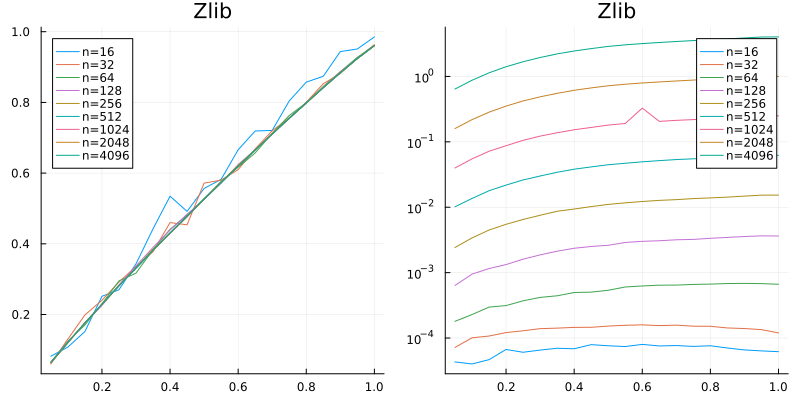

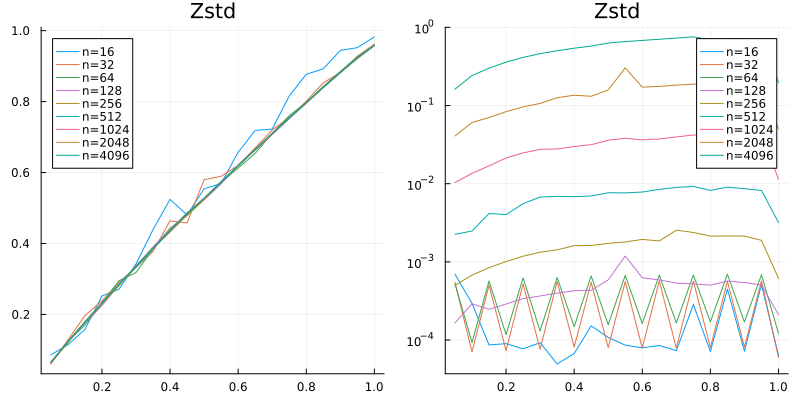

In [5]:
for cmp in compressions
    # idx = df[:,:compression] .== cmp
    # @show df[idx,:]
    p1 = plot(legend=true)
    p2 = plot(legend=true, yscale=:log10)
    for n in ndim
        idx = (df[:,:compression] .== cmp) .& (df[:,:n] .== n)
        # @show df[idx,:]
        my_label = "n=$n"
        plot!(p1, df[idx,:sparsity], df[idx,:ratio], label=my_label)
        plot!(p2, df[idx,:sparsity], df[idx,:time], label=my_label)
    end
    p = plot(p1, p2, size=(800,400), title=cmp)
    display(p)
end

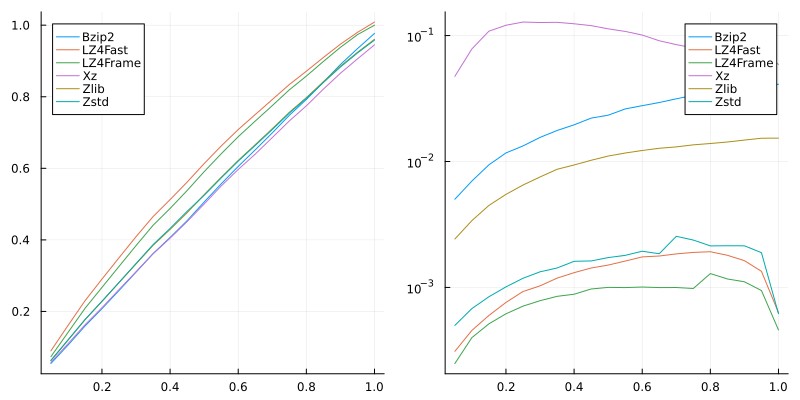

In [6]:
p1 = plot(legend=true)
p2 = plot(legend=true, yscale=:log10)

for cmp in compressions
    idx = (df[:,:compression] .== cmp) .& (df[:,:n] .== 256)
    plot!(p1, df[idx,:sparsity], df[idx,:ratio], label=cmp)
    plot!(p2, df[idx,:sparsity], df[idx,:time], label=cmp)
end

p = plot(p1, p2, size=(800,400))
display(p)

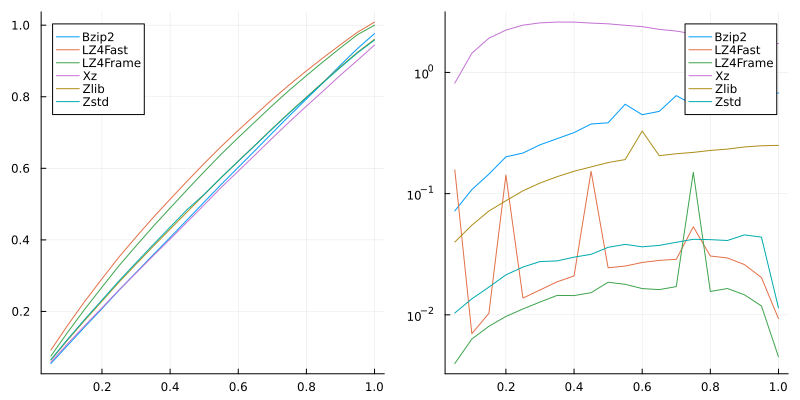

In [7]:
p1 = plot(legend=true)
p2 = plot(legend=true, yscale=:log10)

for cmp in compressions
    idx = (df[:,:compression] .== cmp) .& (df[:,:n] .== 1024)
    plot!(p1, df[idx,:sparsity], df[idx,:ratio], label=cmp)
    plot!(p2, df[idx,:sparsity], df[idx,:time], label=cmp)
end

p = plot(p1, p2, size=(800,400))
display(p)

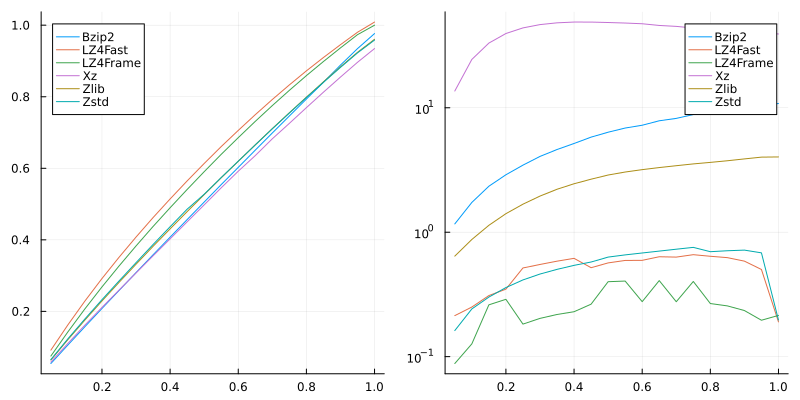

In [8]:
p1 = plot(legend=true)
p2 = plot(legend=true, yscale=:log10)

for cmp in compressions
    idx = (df[:,:compression] .== cmp) .& (df[:,:n] .== 4096)
    plot!(p1, df[idx,:sparsity], df[idx,:ratio], label=cmp)
    plot!(p2, df[idx,:sparsity], df[idx,:time], label=cmp)
end

p = plot(p1, p2, size=(800,400))
display(p)

# Structured Matrix

In [9]:
sm_df = CSV.read("results_compression_structured_matrix.csv", DataFrames.DataFrame)
compressions = unique(sm_df[:,:compression])
ndim = unique(sm_df[:,:n])
nbytes = unique(sm_df[:,:size])
pvals = unique(sm_df[:,:p])
qvals = unique(sm_df[:,:q])
;

In [18]:
sm_df

Row,n,size,func,p,q,compression,compressed_size,ratio,time
,Int64,Int64,String31,Int64,Int64,String15,Int64,Float64,Float64
1,16,2048,sin(0x)cos(0y),0,0,Bzip2,52,0.0253906,9.5016e-5
2,16,2048,sin(0x)cos(0y),0,0,LZ4Fast,204,0.0996094,7.209e-6
3,16,2048,sin(0x)cos(0y),0,0,LZ4Frame,202,0.0986328,1.1566e-5
4,16,2048,sin(0x)cos(0y),0,0,Xz,88,0.0429688,0.00249781
5,16,2048,sin(0x)cos(0y),0,0,Zlib,35,0.0170898,2.0216e-5
6,16,2048,sin(0x)cos(0y),0,0,Zstd,109,0.0532227,0.000464441
7,32,8192,sin(0x)cos(0y),0,0,Bzip2,54,0.0065918,0.0212828
8,32,8192,sin(0x)cos(0y),0,0,LZ4Fast,461,0.0562744,1.7174e-5
9,32,8192,sin(0x)cos(0y),0,0,LZ4Frame,378,0.0461426,6.96e-6


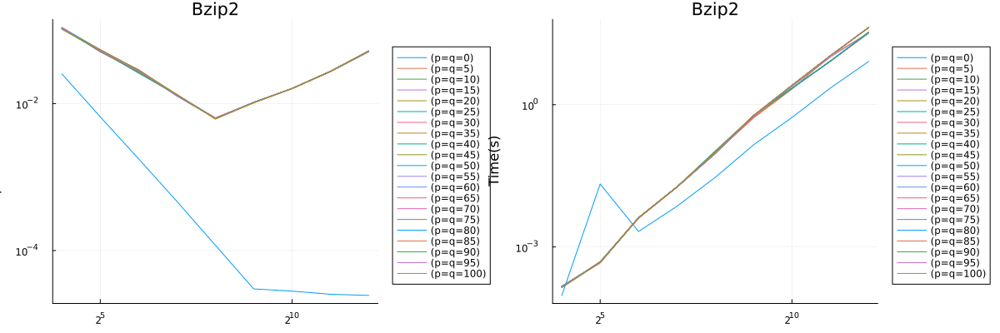

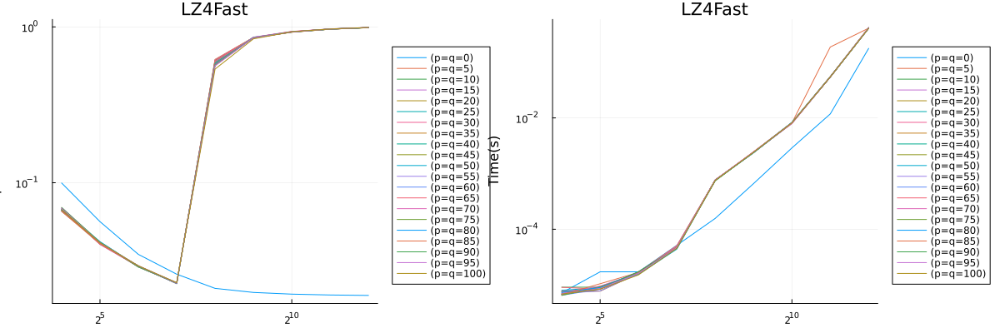

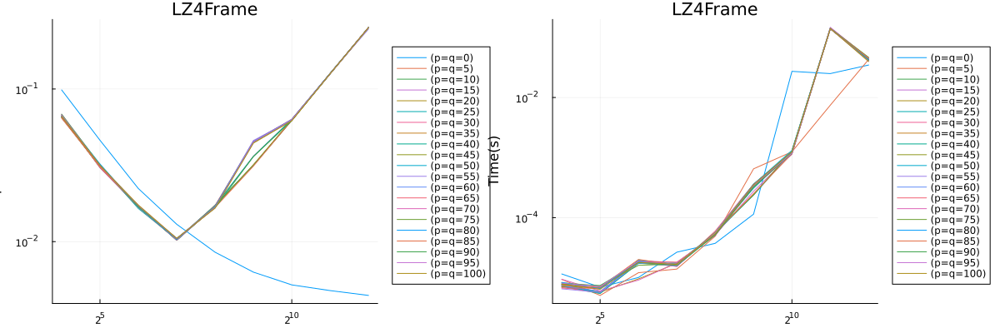

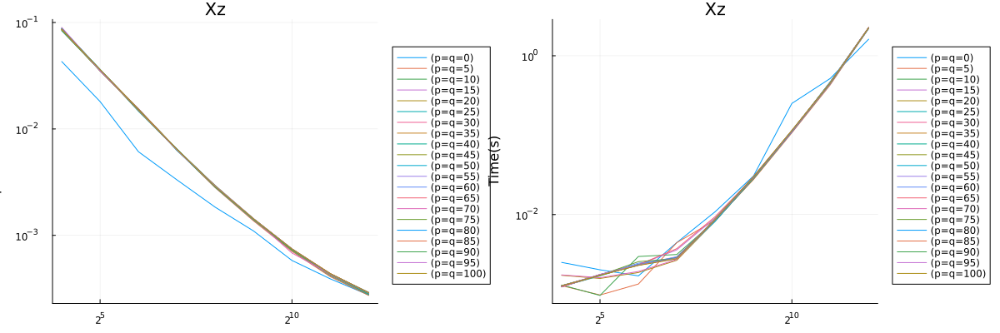

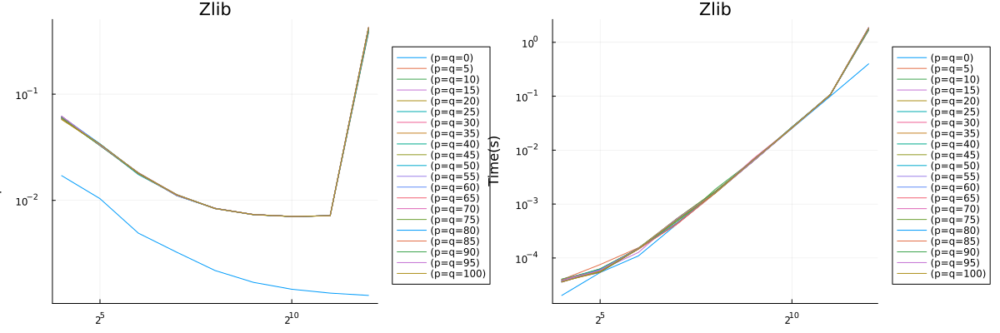

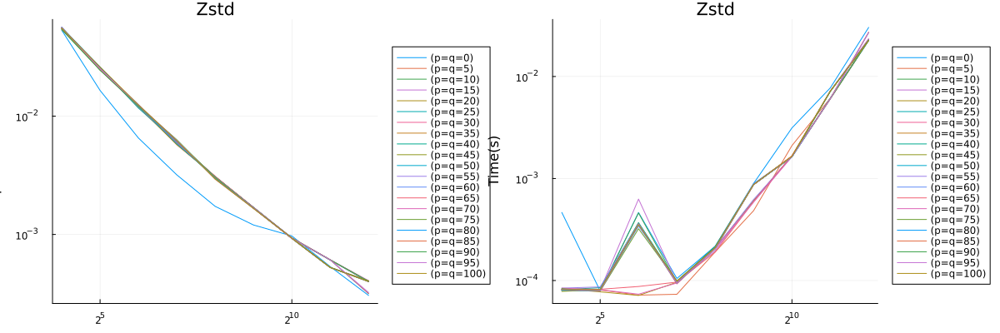

In [10]:
for cmp in compressions
    # idx = df[:,:compression] .== cmp
    # @show df[idx,:]
    p1 = plot(legend=:outerright, xscale=:log2, yscale=:log10, ylabel="Compression Ratio", xlabel="Matrix Dimension")
    p2 = plot(legend=:outerright, xscale=:log2, yscale=:log10, ylabel="Time(s)", xlabel="Matrix Dimension")
    # for n in ndim
    #     idx = (sm_df[:,:compression] .== cmp) .& (sm_df[:,:n] .== n)
    #     # @show df[idx,:]
    #     my_label = "n=$n"
    #     plot!(p1, sm_df[idx,:sparsity], sm_df[idx,:ratio], label=my_label)
    #     plot!(p2, sm_df[idx,:sparsity], sm_df[idx,:time], label=my_label)
    # end
    # for p in pvals[1], q in qvals
    for q in qvals
        idx = (sm_df[:,:compression] .== cmp) .& (sm_df[:,:p] .== q) .& (sm_df[:,:q] .== q)
        # my_label = "(p=$p,q=$q)"
        my_label = "(p=q=$q)"
        plot!(p1, sm_df[idx,:n], sm_df[idx,:ratio], label=my_label)
        plot!(p2, sm_df[idx,:n], sm_df[idx,:time], label=my_label)
    end
    p = plot(p1, p2, size=(1200,400), title=cmp)
    display(p)
end

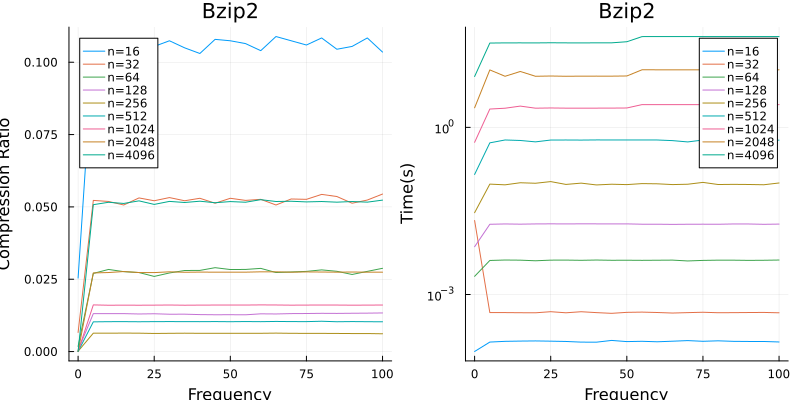

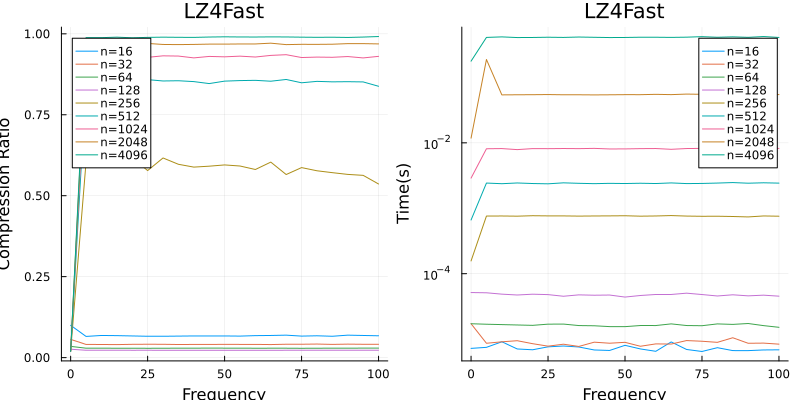

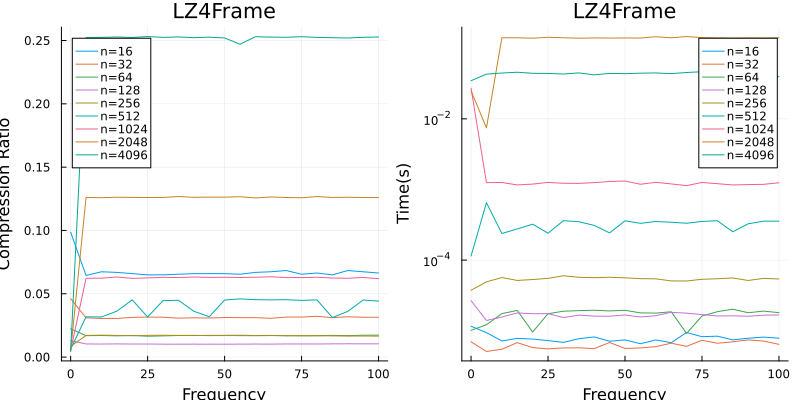

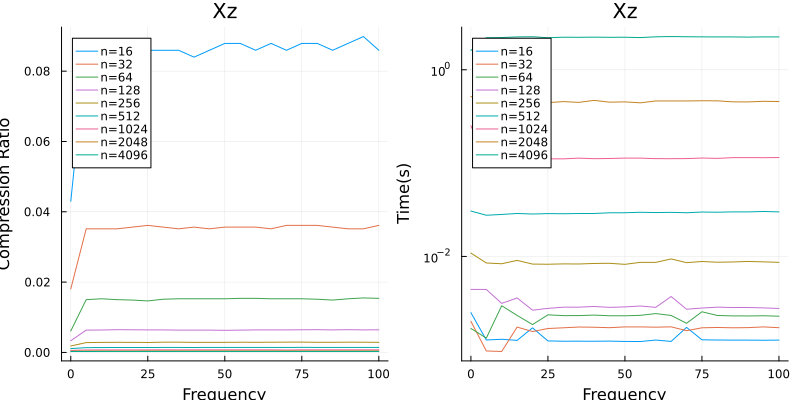

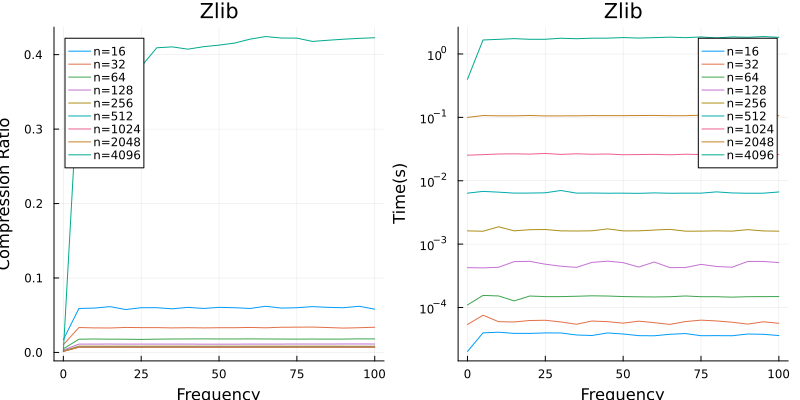

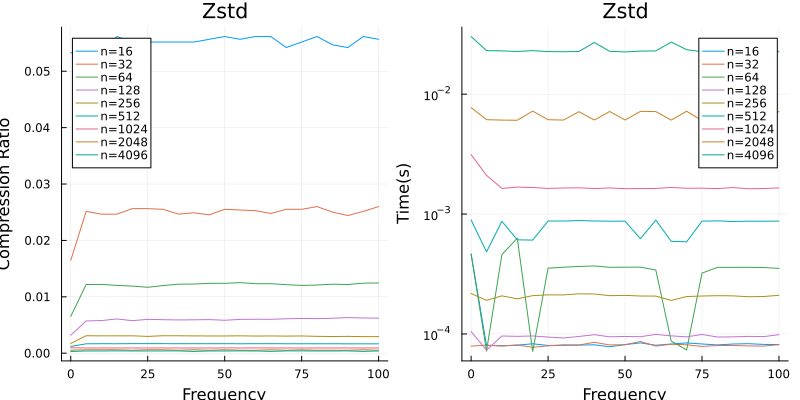

In [11]:
for cmp in compressions
    # idx = df[:,:compression] .== cmp
    # @show df[idx,:]
    p1 = plot(legend=true, ylabel="Compression Ratio", xlabel="Frequency")
    p2 = plot(legend=true, yscale=:log10, ylabel="Time(s)", xlabel="Frequency")
    # for n in ndim
    #     idx = (sm_df[:,:compression] .== cmp) .& (sm_df[:,:n] .== n)
    #     # @show df[idx,:]
    #     my_label = "n=$n"
    #     plot!(p1, sm_df[idx,:sparsity], sm_df[idx,:ratio], label=my_label)
    #     plot!(p2, sm_df[idx,:sparsity], sm_df[idx,:time], label=my_label)
    # end
    # for p in pvals[1], q in qvals
    @assert(length(pvals) == length(qvals))
    for n in ndim
        # idx = (sm_df[:,:compression] .== cmp) .& (sm_df[:,:p] .== p) .& (sm_df[:,:q] .== q)
        # my_label = "(p=$p,q=$q)"
        # plot!(p1, sm_df[idx,:n], sm_df[idx,:ratio], label=my_label)
        # plot!(p2, sm_df[idx,:n], sm_df[idx,:time], label=my_label)
        idx = (sm_df[:,:compression] .== cmp) .& (sm_df[:,:n] .== n) .& (sm_df[:,:p] .== sm_df[:,:q])
        # @show sum(idx)
        my_label = "n=$n"
        plot!(p1, qvals, sm_df[idx,:ratio], label=my_label)
        plot!(p2, qvals, sm_df[idx,:time], label=my_label)
    end
    p = plot(p1, p2, size=(800,400), title=cmp)
    display(p)
end

In [12]:
idx = (sm_df[:,:compression] .== compressions[end]) .& (sm_df[:,:n] .== 4096)
sm_df[idx,:]

Row,n,size,func,p,q,compression,compressed_size,ratio,time
,Int64,Int64,String31,Int64,Int64,String15,Int64,Float64,Float64
1,4096,134217728,sin(0x)cos(0y),0,0,Zstd,40981,0.000305332,0.0302563
2,4096,134217728,sin(5x)cos(5y),5,5,Zstd,53596,0.000399321,0.0230802
3,4096,134217728,sin(10x)cos(10y),10,10,Zstd,53661,0.000399806,0.022967
4,4096,134217728,sin(15x)cos(15y),15,15,Zstd,54625,0.000406988,0.0227207
5,4096,134217728,sin(20x)cos(20y),20,20,Zstd,53602,0.000399366,0.0230674
6,4096,134217728,sin(25x)cos(25y),25,25,Zstd,53676,0.000399917,0.0226629
7,4096,134217728,sin(30x)cos(30y),30,30,Zstd,53744,0.000400424,0.0225849
8,4096,134217728,sin(35x)cos(35y),35,35,Zstd,54635,0.000407062,0.0226971
9,4096,134217728,sin(40x)cos(40y),40,40,Zstd,42426,0.000316098,0.0270066


In [13]:
sm_df[:,:time] |> sum

1135.7373421850002

In [14]:
1135.73 / 3600

0.31548055555555554

# Heat Equation

In [15]:
he_df = CSV.read("results_compression_heat_matrix.csv", DataFrames.DataFrame)
compressions = unique(he_df[:,:compression])
ndim = unique(he_df[:,:n])
nbytes = unique(he_df[:,:size])
tfs = unique(he_df[:,:Tf])
# pvals = unique(he_df[:,:p])
# qvals = unique(he_df[:,:q])
;

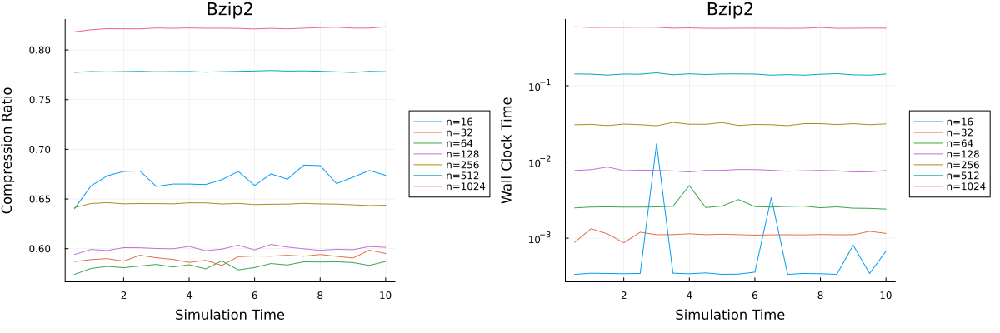

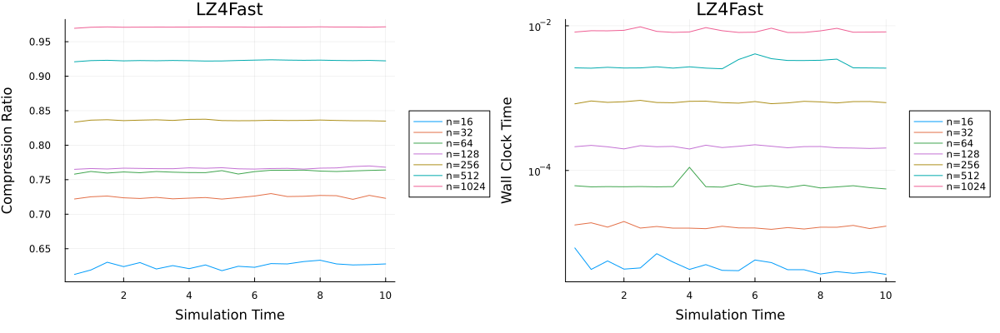

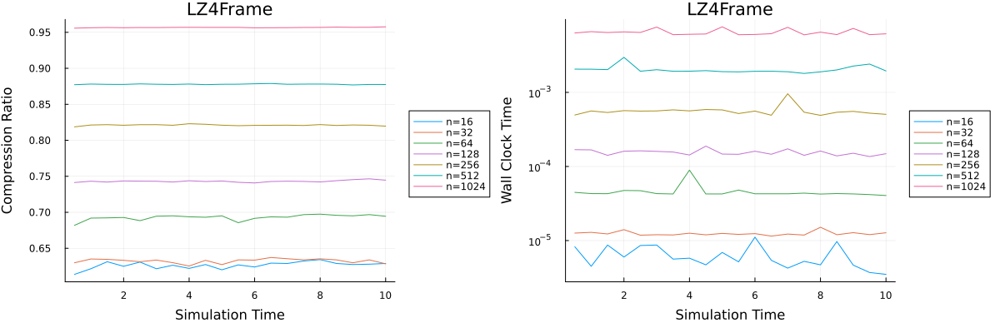

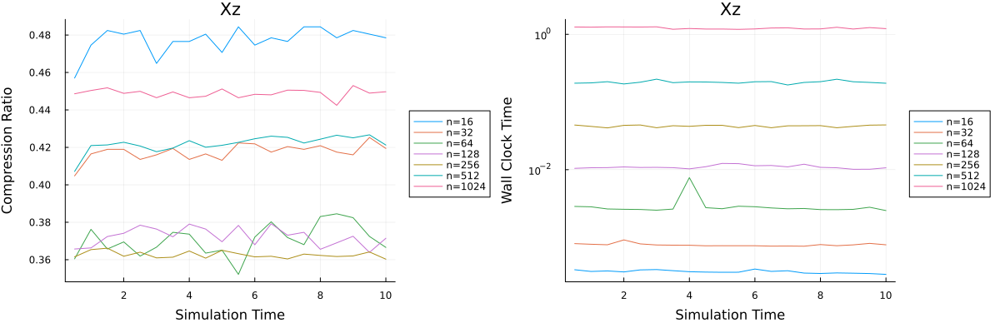

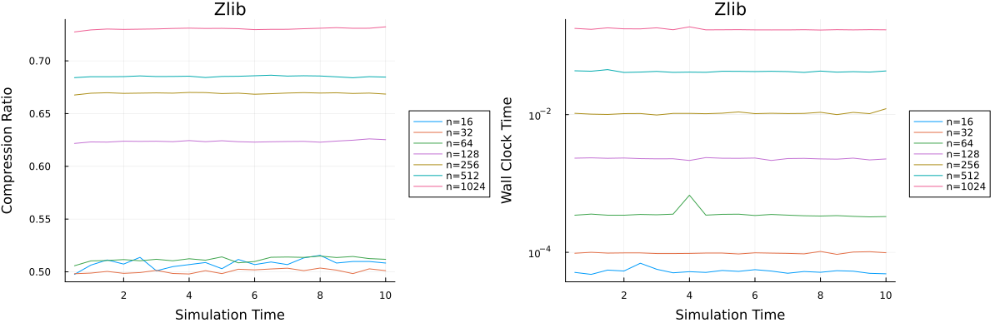

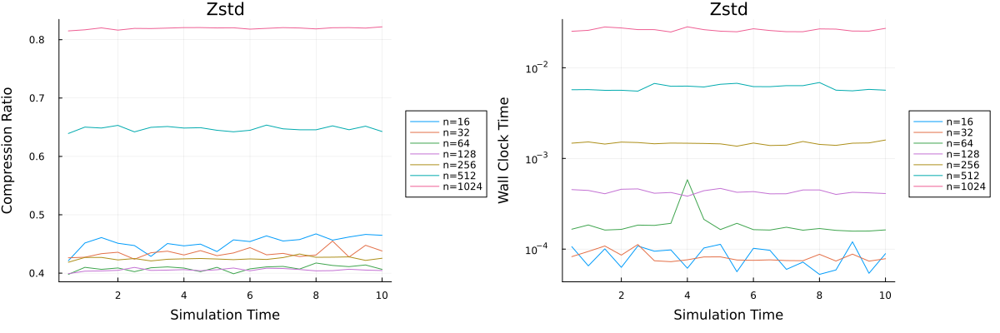

In [16]:
for cmp in compressions
    p1 = plot(legend=:outerright, xlabel="Simulation Time", ylabel="Compression Ratio")
    p2 = plot(legend=:outerright, xlabel="Simulation Time", ylabel="Wall Clock Time", yscale=:log10)
    for n in ndim
        idx = (he_df[:,:compression] .== cmp) .& (he_df[:,:n] .== n)
        plot!(p1, tfs, he_df[idx,:ratio], label="n=$n")
        plot!(p2, tfs, he_df[idx,:time], label="n=$n")
    end
    p = plot(p1, p2, size=(1200,400), title=cmp, left_margin=5mm, bottom_margin=8mm)
    display(p)
end

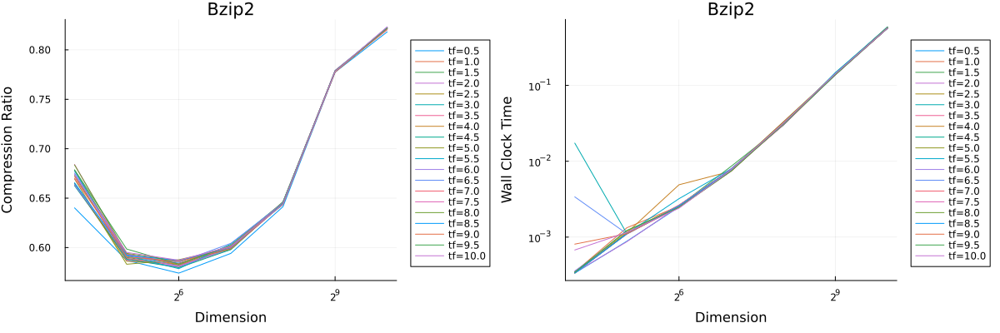

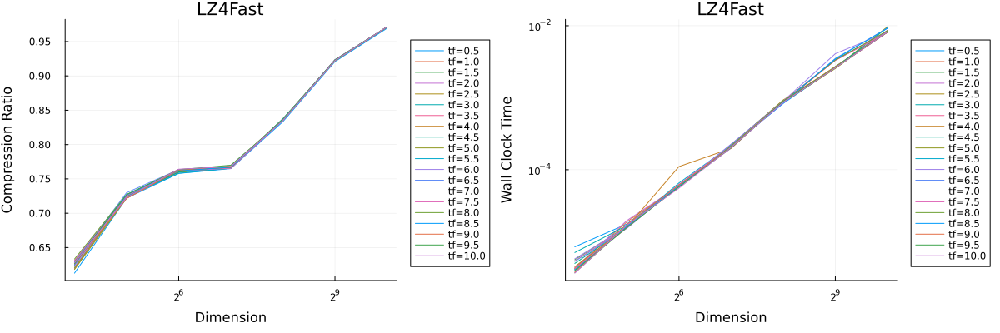

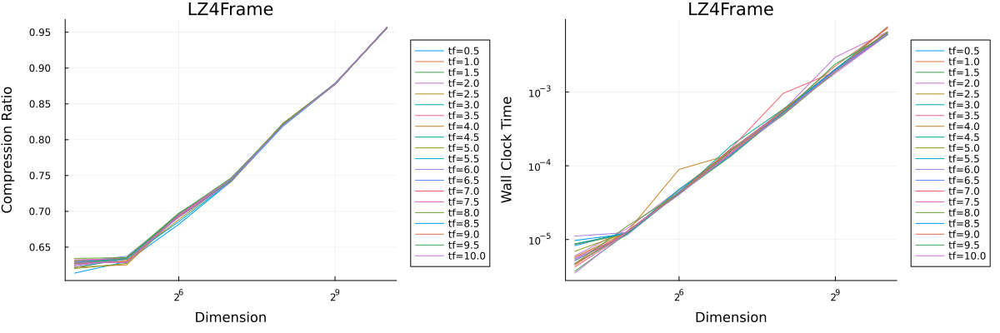

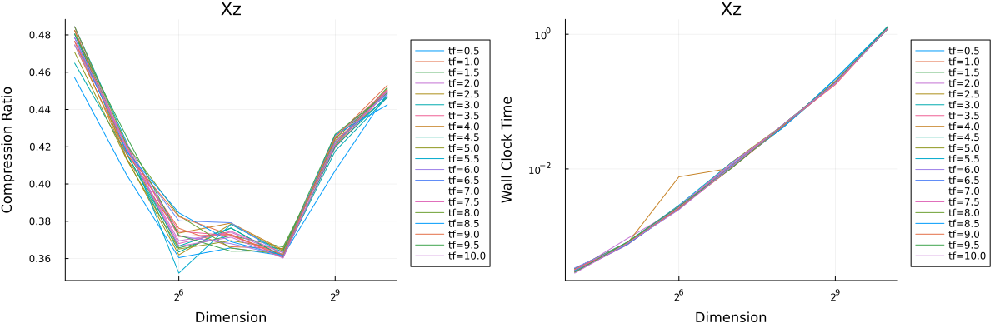

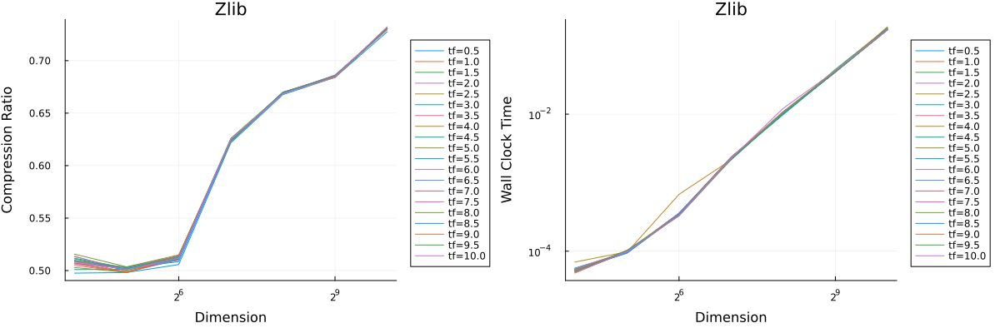

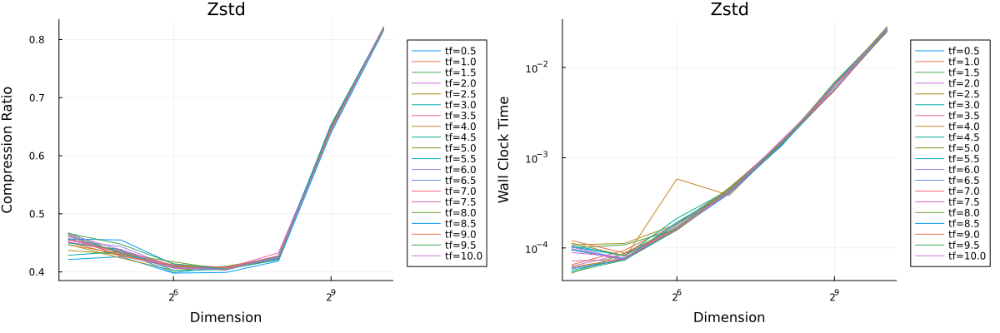

In [17]:
for cmp in compressions
    p1 = plot(legend=:outerright, xlabel="Dimension", ylabel="Compression Ratio", xscale=:log2)
    p2 = plot(legend=:outerright, xlabel="Dimension", ylabel="Wall Clock Time", xscale=:log2, yscale=:log10)
    for tf in tfs
        idx = (he_df[:,:compression] .== cmp) .& (he_df[:,:Tf] .== tf)
        plot!(p1, ndim, he_df[idx,:ratio], label="tf=$tf")
        plot!(p2, ndim, he_df[idx,:time], label="tf=$tf")
    end
    p = plot(p1, p2, size=(1200,400), title=cmp, left_margin=5mm, bottom_margin=8mm,)
    display(p)
end